In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML

In [3]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS=50
n_classes = 3

In [4]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "PlantVillage",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


In [5]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [6]:
len(dataset)

68

In [7]:
68*32

2176

In [8]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[1 1 1 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 2 0 0]


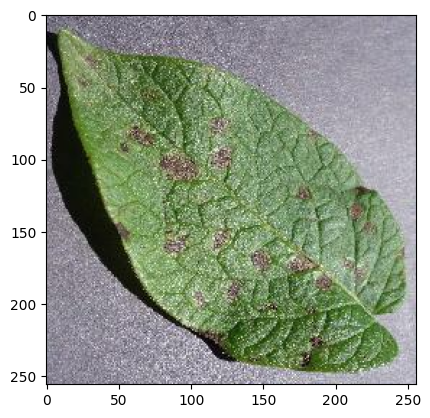

In [9]:
for image_batch, label_batch in dataset.take(1):
    plt.imshow(image_batch[0].numpy().astype("uint8"))

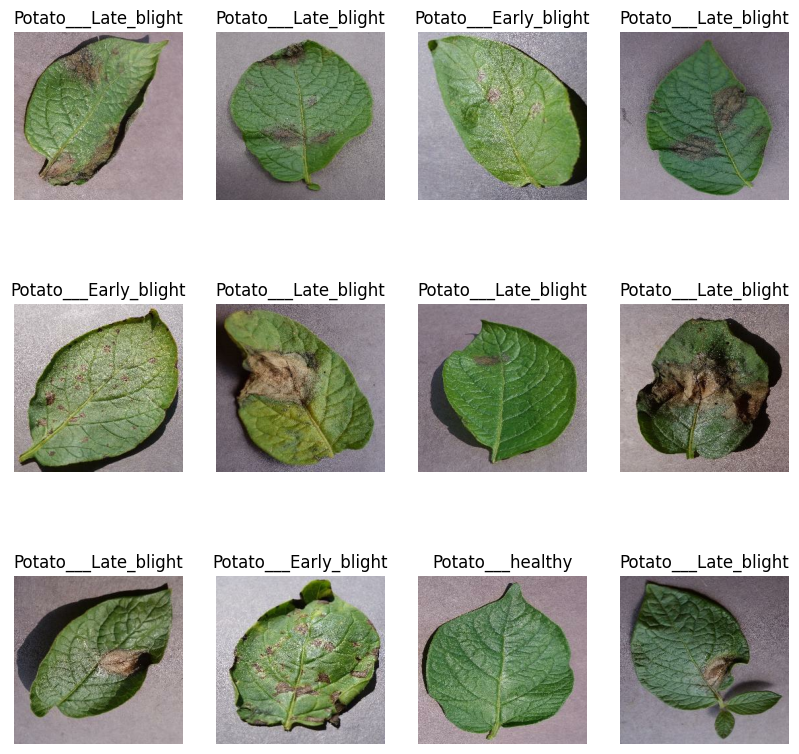

In [10]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

In [11]:
# 80% ==> training
# 20% ==> 10% validation, 10% test

In [12]:
train_size = 0.8
len(dataset)*train_size

54.400000000000006

In [13]:
train_ds = dataset.take(54)
len(train_ds)

54

In [14]:
test_ds = dataset.skip(54)
len(test_ds)

14

In [15]:
val_size=0.1
len(dataset)*val_size

6.800000000000001

In [16]:
val_ds = test_ds.take(6)
len(val_ds)

6

In [17]:
test_ds = test_ds.skip(6)
len(test_ds)

8

In [18]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [19]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [20]:
len(train_ds)


54

In [21]:
len(val_ds)


6

In [22]:
len(test_ds)


8

In [23]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

In [24]:
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    layers.Rescaling(1./255),
])


C:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\preprocessing\tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [25]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
])

In [26]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)

In [27]:
model = models.Sequential([
    layers.InputLayer(input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS)),
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),  
    layers.Rescaling(1./255),  # Rescale pixel values
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.summary()




C:\Users\Admin\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\core\input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

In [28]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [29]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=50,
)

Epoch 1/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 91s 2s/step - accuracy: 0.4514 - loss: 0.9326 - val_accuracy: 0.5885 - val_loss: 0.8124
Epoch 2/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.6888 - loss: 0.6885 - val_accuracy: 0.7865 - val_loss: 0.4643
Epoch 3/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.8561 - loss: 0.3375 - val_accuracy: 0.8542 - val_loss: 0.2947
Epoch 4/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.9131 - loss: 0.2173 - val_accuracy: 0.9427 - val_loss: 0.1551
Epoch 5/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.9234 - loss: 0.1937 - val_accuracy: 0.9531 - val_loss: 0.1503
Epoch 6/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 67s 1s/step - accuracy: 0.9293 - loss: 0.1627 - val_accuracy: 0.9479 - val_loss: 0.1177
Epoch 7/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.9635 - loss: 0.1060 - val_accuracy: 0.9844 - val_loss: 0.0675
Epoch 8/50
54/54 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.9568 - loss: 0.1079 - val_accuracy: 0.9792 - val_loss:

In [30]:
scores = model.evaluate(test_ds)


8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 210ms/step - accuracy: 0.9883 - loss: 0.0225


In [31]:
scores


[0.024946777150034904, 0.98828125]

In [32]:
history


In [33]:
history.params


{'verbose': 1, 'epochs': 50, 'steps': 54}

In [34]:
history.history.keys()


dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [35]:
type(history.history['loss'])


list

In [36]:
len(history.history['loss'])


50

In [37]:
history.history['loss'][:5] # show loss for first 5 epochs


[0.8985580205917358,
 0.5621582865715027,
 0.3063083589076996,
 0.21466191112995148,
 0.19105389714241028]

In [38]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

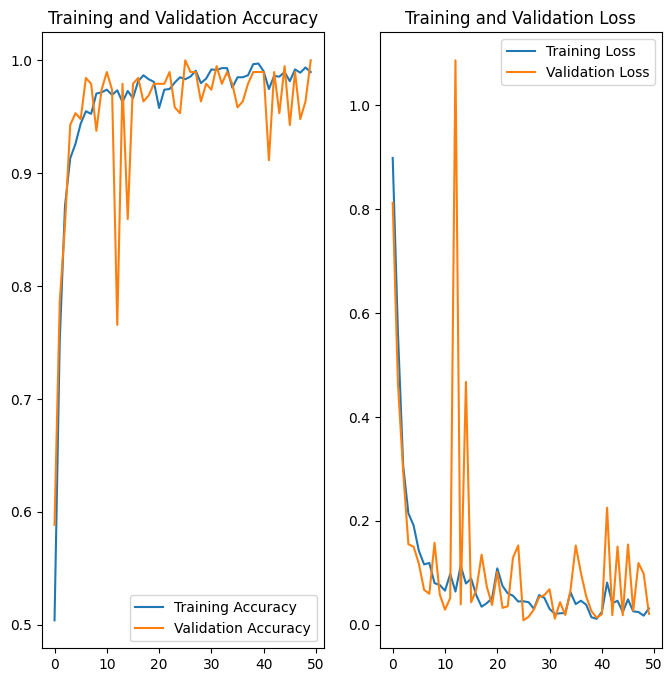

In [39]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
predicted label: Potato___Late_blight


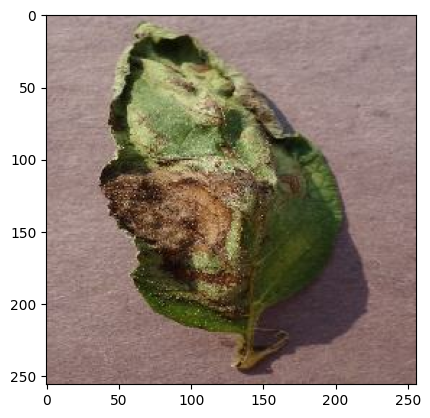

In [40]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [41]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


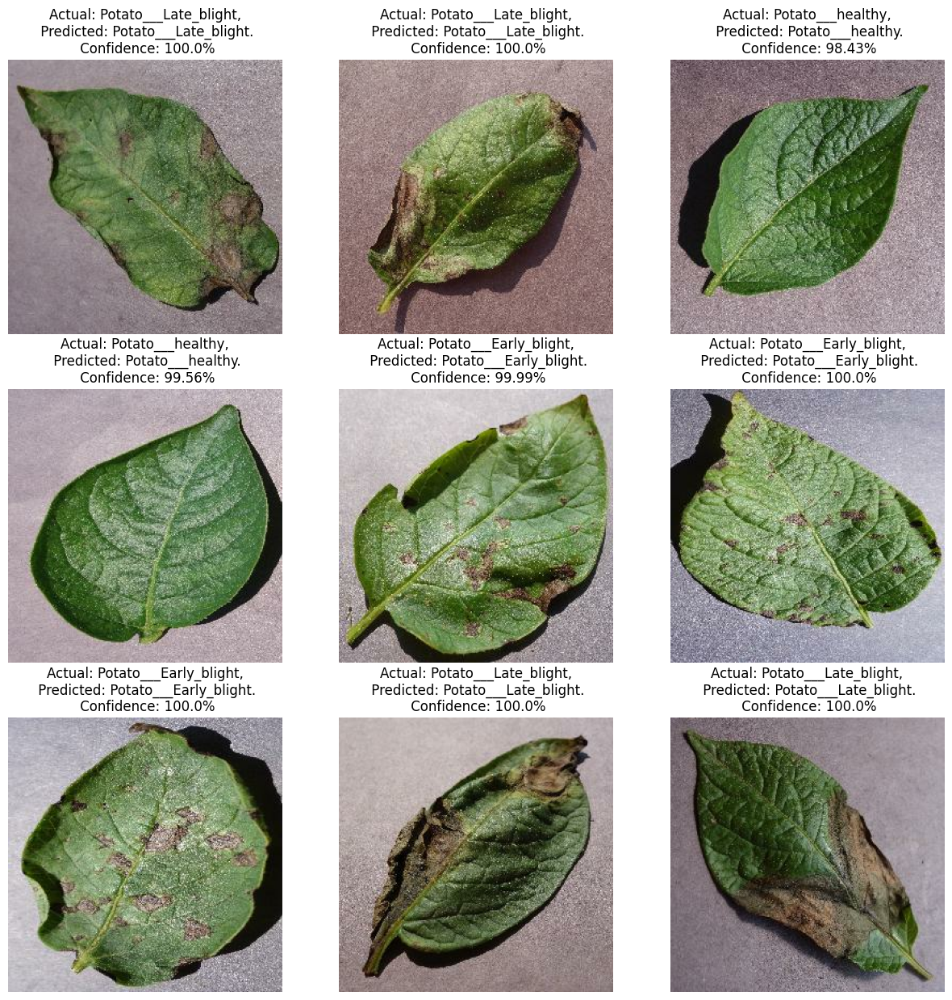

In [42]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [43]:
import os

model_files = [int(i.split('.')[0]) for i in os.listdir("../models") if i.split('.')[0].isdigit()]
model_version = max(model_files) + 1 if model_files else 1
model.save(f"../models/{model_version}.h5")

In [44]:
model.save("../potatoes.h5")

In [45]:
# Save as Keras format
model.save("D:/PotatoDie/models/1.keras", save_format='keras')


In [46]:
# Save as HDF5 format
model.save("D:/PotatoDie/models/1.h5")


In [47]:
print(model.summary())


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing_1 (Resizing)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 551,243 (2.10 MB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 367,496 (1.40 MB)

None


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


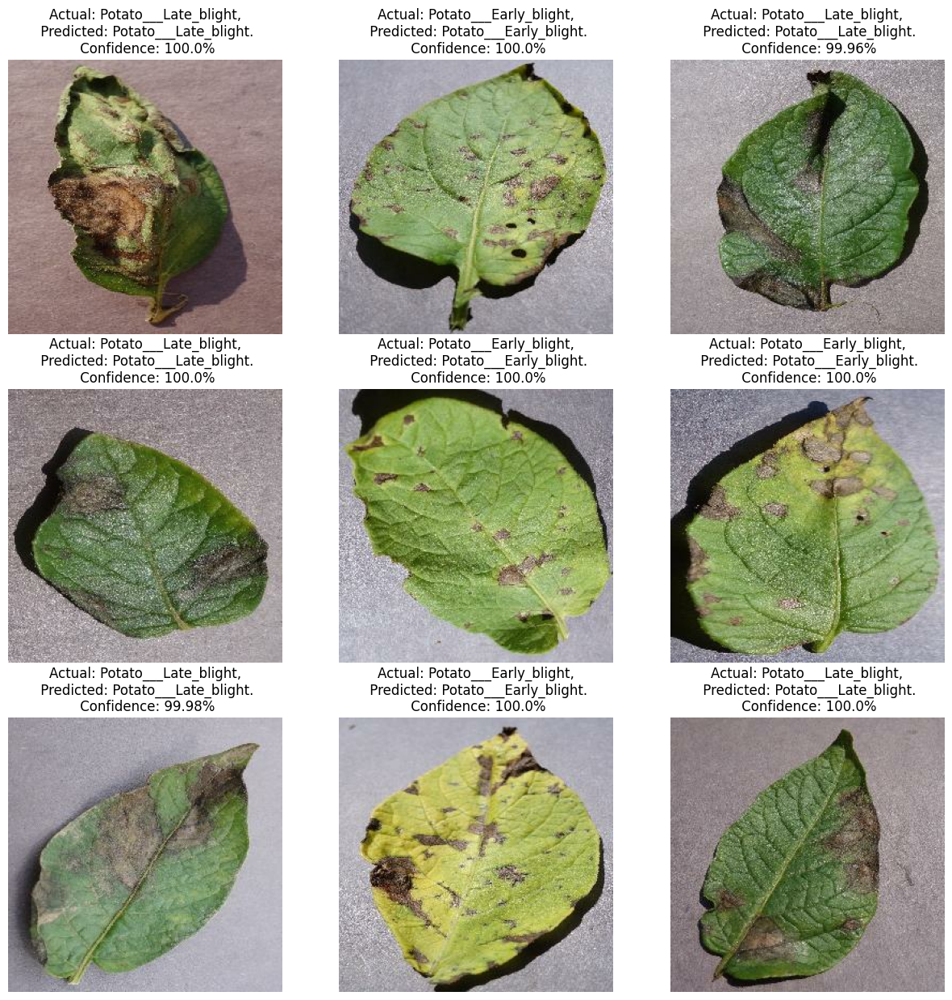

In [49]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

Confusion Matrix:
[[124   0   0]
 [  1 110   0]
 [  0   2  19]]


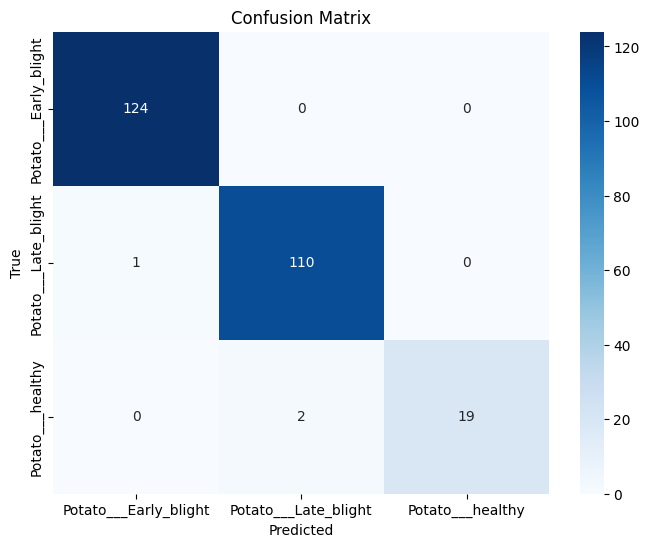


Classification Report:
                       precision    recall  f1-score   support

Potato___Early_blight       0.99      1.00      1.00       124
 Potato___Late_blight       0.98      0.99      0.99       111
     Potato___healthy       1.00      0.90      0.95        21

             accuracy                           0.99       256
            macro avg       0.99      0.97      0.98       256
         weighted avg       0.99      0.99      0.99       256

Best temperature for calibration: 0.5

Calibrated Confusion Matrix:
[[124   0   0]
 [  1 110   0]
 [  0   2  19]]


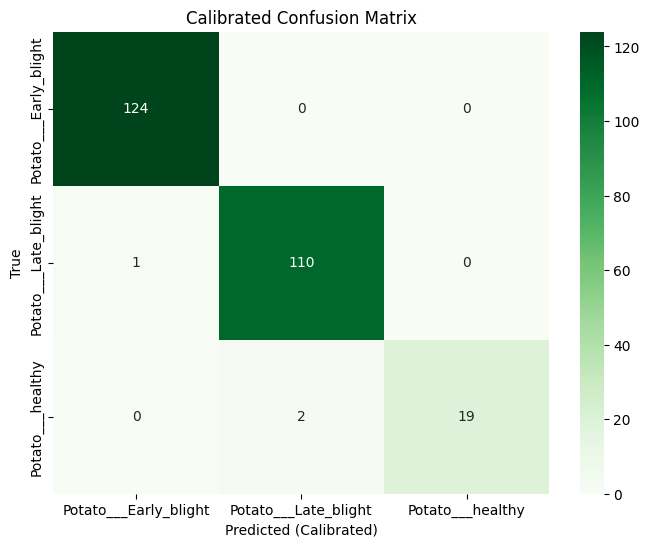


Calibrated Classification Report:
                       precision    recall  f1-score   support

Potato___Early_blight       0.99      1.00      1.00       124
 Potato___Late_blight       0.98      0.99      0.99       111
     Potato___healthy       1.00      0.90      0.95        21

             accuracy                           0.99       256
            macro avg       0.99      0.97      0.98       256
         weighted avg       0.99      0.99      0.99       256



In [51]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Collect test data
test_images, test_labels = [], []
for imgs, lbls in test_ds:
    test_images.append(imgs.numpy())
    test_labels.append(lbls.numpy())
test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Get predictions
test_preds = model.predict(test_images, verbose=0)
test_pred_labels = np.argmax(test_preds, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_labels, test_pred_labels)
print("Confusion Matrix:")
print(cm)

# Visualize Confusion Matrix with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Performance Metrics
print("\nClassification Report:")
print(classification_report(test_labels, test_pred_labels, target_names=class_names))

# Calibration (to define best_temp)
val_images, val_labels = [], []
for imgs, lbls in val_ds:
    val_images.append(imgs.numpy())
    val_labels.append(lbls.numpy())
val_images = np.concatenate(val_images)
val_labels = np.concatenate(val_labels)

raw_preds = model.predict(val_images, verbose=0)

def temperature_scale(logits, temperature):
    return tf.nn.softmax(logits / temperature).numpy()

# Find optimal temperature
best_temp, best_acc = 1.0, 0.0
for temp in [0.5, 1.0, 1.5, 2.0, 2.5]:
    scaled_preds = temperature_scale(raw_preds, temp)
    pred_labels = np.argmax(scaled_preds, axis=1)
    acc = accuracy_score(val_labels, pred_labels)
    if acc > best_acc:
        best_temp, best_acc = temp, acc
print(f"Best temperature for calibration: {best_temp}")

# Optional: Confusion Matrix with Calibrated Predictions
calibrated_preds = temperature_scale(test_preds, best_temp)
calibrated_pred_labels = np.argmax(calibrated_preds, axis=1)
cm_calibrated = confusion_matrix(test_labels, calibrated_pred_labels)
print("\nCalibrated Confusion Matrix:")
print(cm_calibrated)

plt.figure(figsize=(8, 6))
sns.heatmap(cm_calibrated, annot=True, fmt='d', cmap='Greens', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted (Calibrated)')
plt.ylabel('True')
plt.title('Calibrated Confusion Matrix')
plt.show()

print("\nCalibrated Classification Report:")
print(classification_report(test_labels, calibrated_pred_labels, target_names=class_names))

Confusion Matrix:
[[124   0   0]
 [  1 110   0]
 [  0   2  19]]


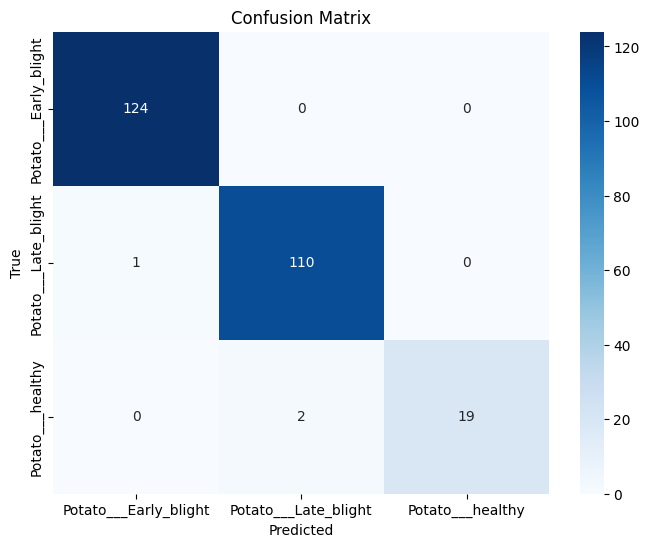


Classification Report:
                       precision    recall  f1-score   support

Potato___Early_blight       0.99      1.00      1.00       124
 Potato___Late_blight       0.98      0.99      0.99       111
     Potato___healthy       1.00      0.90      0.95        21

             accuracy                           0.99       256
            macro avg       0.99      0.97      0.98       256
         weighted avg       0.99      0.99      0.99       256


Found 3 misclassified images.


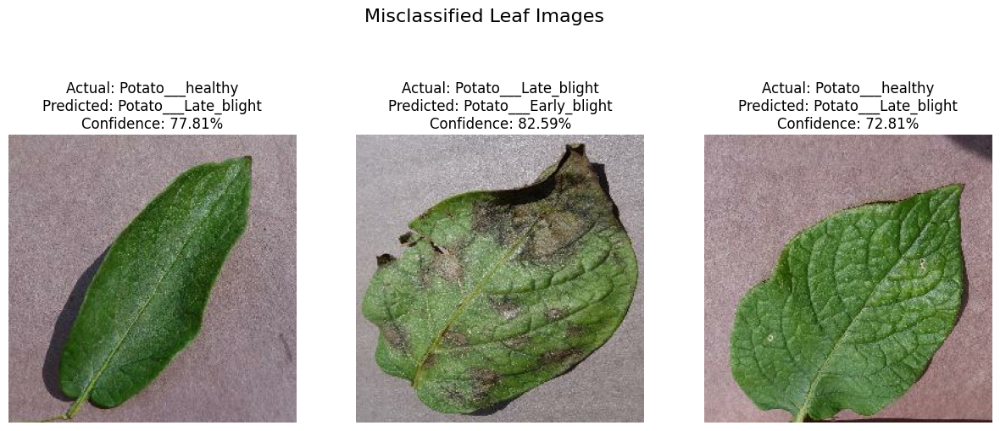

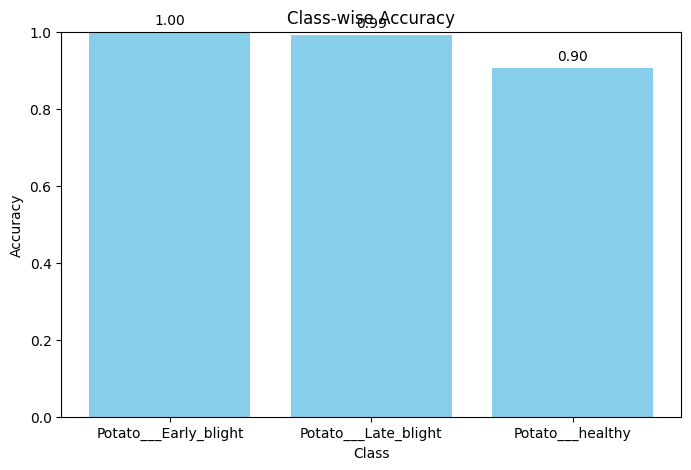

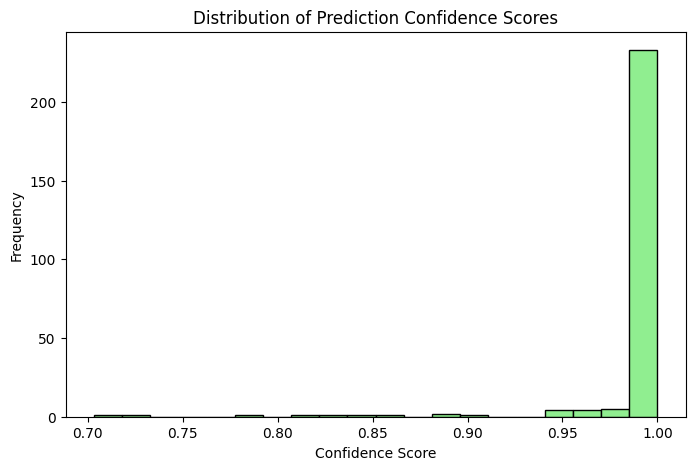

In [57]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Collect test data
test_images, test_labels = [], []
for imgs, lbls in test_ds:
    test_images.append(imgs.numpy())
    test_labels.append(lbls.numpy())
test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Get predictions
test_preds = model.predict(test_images, verbose=0)
test_pred_labels = np.argmax(test_preds, axis=1)
confidence_scores = np.max(test_preds, axis=1)  # Confidence for each prediction

# Confusion Matrix
cm = confusion_matrix(test_labels, test_pred_labels)
print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Performance Metrics
print("\nClassification Report:")
print(classification_report(test_labels, test_pred_labels, target_names=class_names))

# Feature 1: Misclassified Images (No Heatmaps)
misclassified_idx = np.where(test_labels != test_pred_labels)[0]
if len(misclassified_idx) > 0:
    print(f"\nFound {len(misclassified_idx)} misclassified images.")
    plt.figure(figsize=(15, 15))
    for i, idx in enumerate(misclassified_idx[:min(9, len(misclassified_idx))]):
        img = test_images[idx].astype('uint8')
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(img)
        predicted_class = class_names[test_pred_labels[idx]]
        actual_class = class_names[test_labels[idx]]
        confidence = round(100 * confidence_scores[idx], 2)
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%")
        plt.axis("off")
    plt.suptitle("Misclassified Leaf Images", fontsize=16)
    plt.show()
else:
    print("\nNo misclassified images found.")

# Feature 2: Class-wise Accuracy Plot
class_accuracy = [np.mean(test_pred_labels[test_labels == i] == i) for i in range(len(class_names))]
plt.figure(figsize=(8, 5))
plt.bar(class_names, class_accuracy, color='skyblue')
plt.xlabel('Class')
plt.ylabel('Accuracy')
plt.title('Class-wise Accuracy')
plt.ylim(0, 1)
for i, v in enumerate(class_accuracy):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center')
plt.show()

# Feature 3: Confidence Distribution
plt.figure(figsize=(8, 5))
plt.hist(confidence_scores, bins=20, color='lightgreen', edgecolor='black')
plt.xlabel('Confidence Score')
plt.ylabel('Frequency')
plt.title('Distribution of Prediction Confidence Scores')
plt.show()

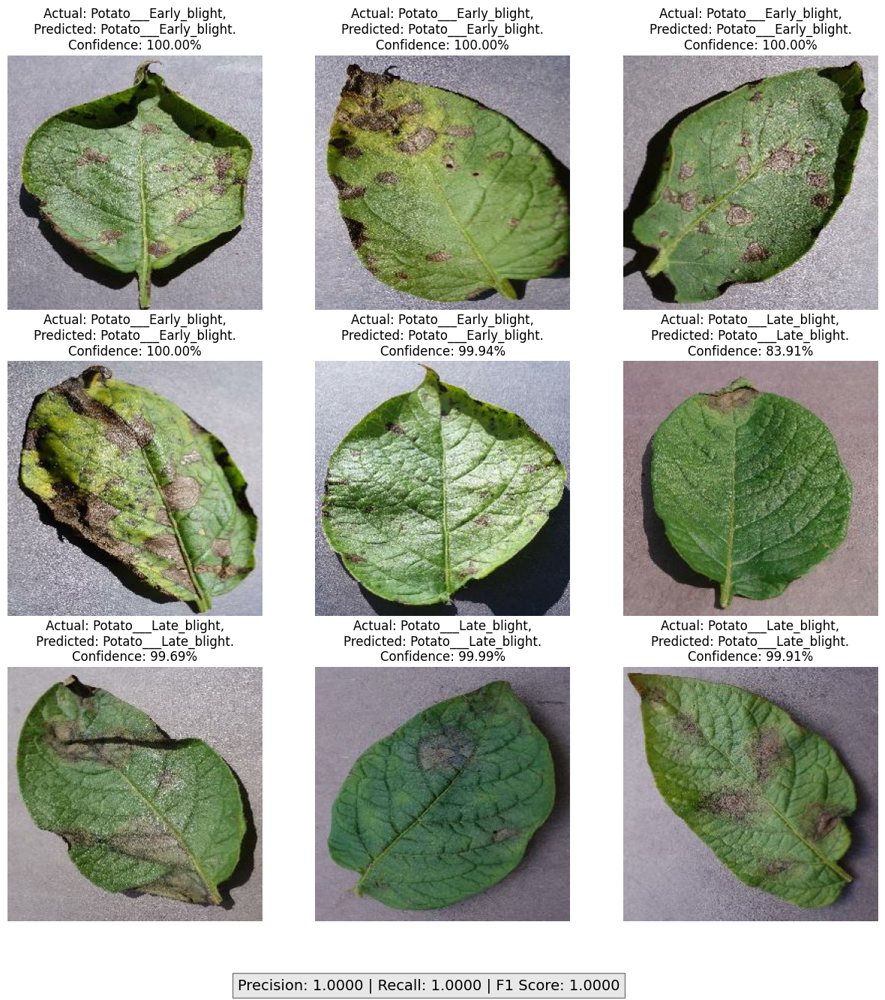

Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


In [62]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score

plt.figure(figsize=(15, 15))

y_true = []
y_pred = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\nPredicted: {predicted_class}.\nConfidence: {confidence:.2f}%")
        plt.axis("off")

        # Store values for metric calculation
        y_true.append(class_names.index(actual_class))  # Convert actual class to index
        y_pred.append(class_names.index(predicted_class))  # Convert predicted class to index

# Convert lists to NumPy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute Precision, Recall, and F1-score
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

# Display the metrics below the image grid
plt.figtext(0.5, 0.05, f"Precision: {precision:.4f} | Recall: {recall:.4f} | F1 Score: {f1:.4f}", 
            wrap=True, horizontalalignment='center', fontsize=14, bbox={"facecolor": "lightgray", "alpha": 0.5, "pad": 5})

plt.show()

# Print the metrics in the console as well
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Confusion Matrix:
[[124   0   0]
 [  1 110   0]
 [  0   2  19]]


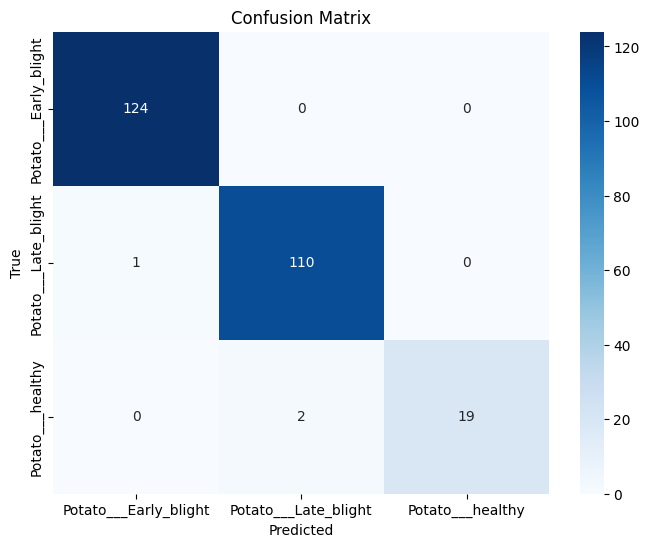


Test Data Classification Report:
                       precision    recall  f1-score   support

Potato___Early_blight       0.99      1.00      1.00       124
 Potato___Late_blight       0.98      0.99      0.99       111
     Potato___healthy       1.00      0.90      0.95        21

             accuracy                           0.99       256
            macro avg       0.99      0.97      0.98       256
         weighted avg       0.99      0.99      0.99       256



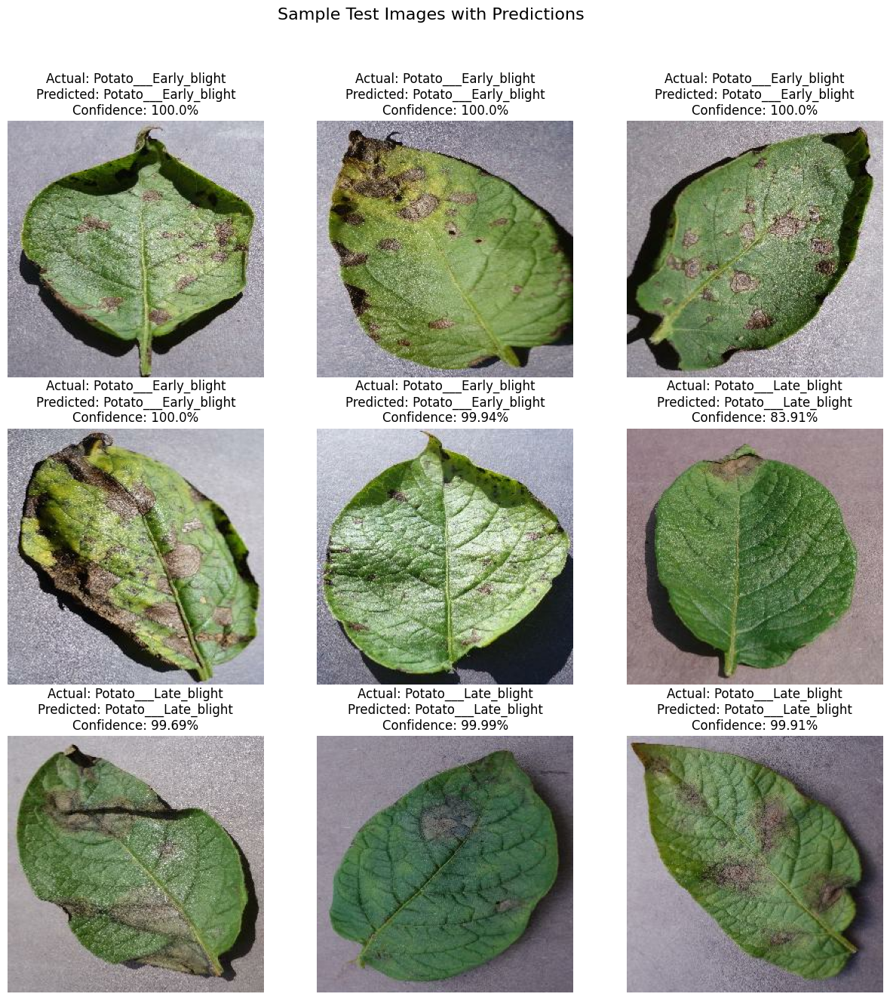

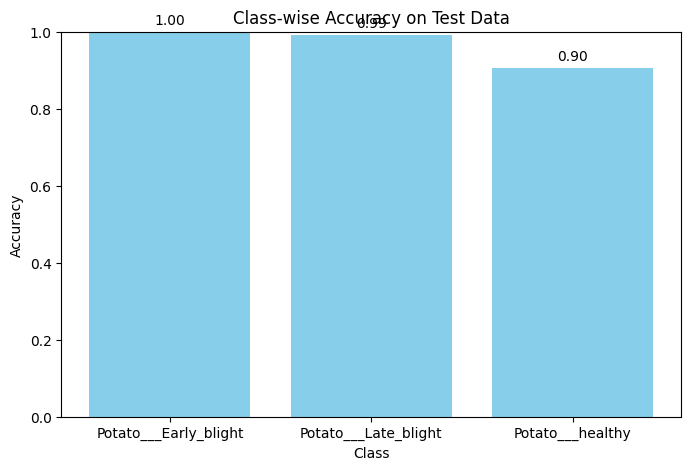

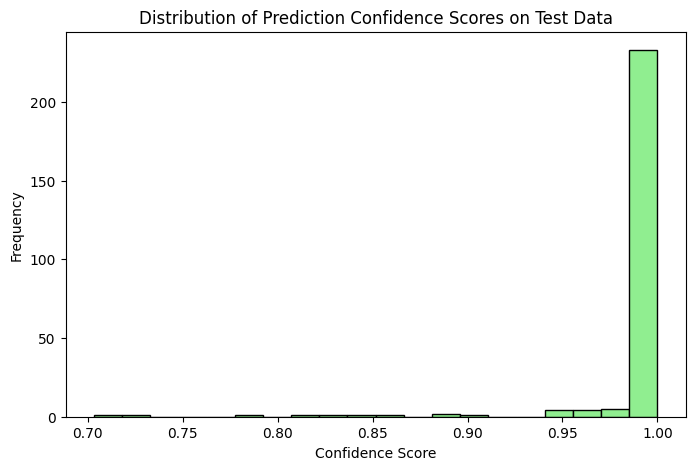

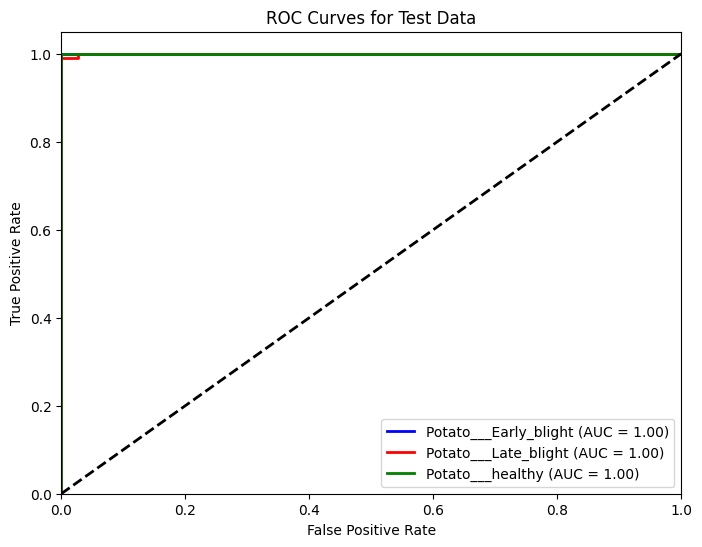

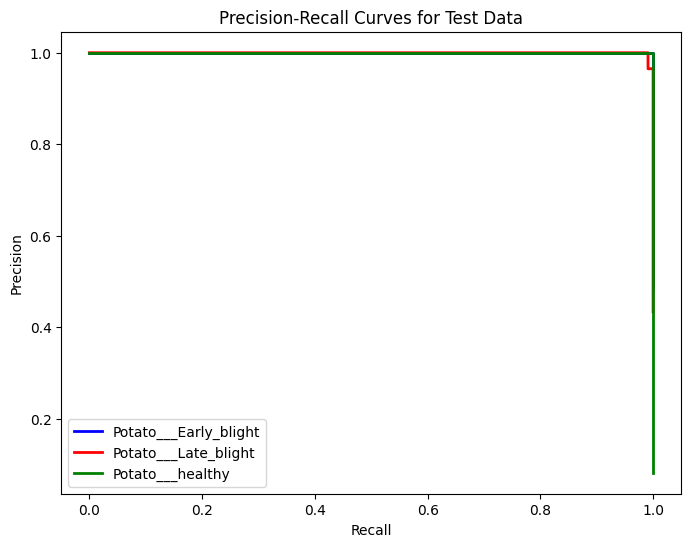

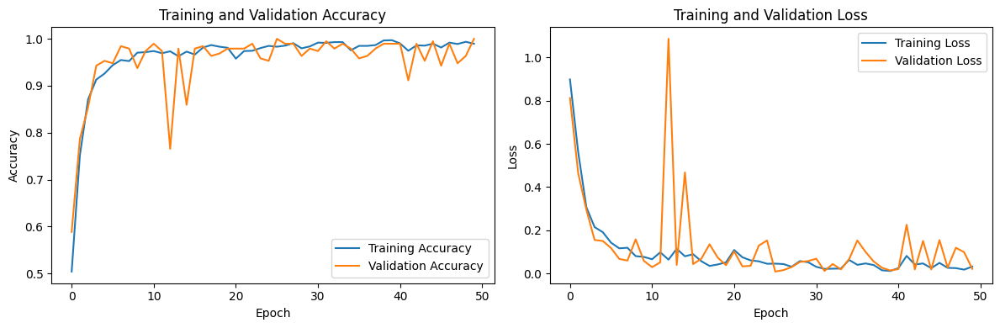

In [64]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import cycle

# Define predict function
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    predictions = model.predict(img_array, verbose=0)
    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * np.max(predictions[0]), 2)
    return predicted_class, confidence

# Collect test data
test_images, test_labels = [], []
for imgs, lbls in test_ds:
    test_images.append(imgs.numpy())
    test_labels.append(lbls.numpy())
test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Predict on test images
test_preds = model.predict(test_images, verbose=0)
test_pred_labels = np.argmax(test_preds, axis=1)
confidence_scores = np.max(test_preds, axis=1)

# Confusion Matrix
cm = confusion_matrix(test_labels, test_pred_labels)
print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall, F1-Score, and Support
print("\nTest Data Classification Report:")
print(classification_report(test_labels, test_pred_labels, target_names=class_names))

# Visualize 9 Test Images with Predictions
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(min(9, len(images))):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]
        plt.title(f"Actual: {actual_class}\nPredicted: {predicted_class}\nConfidence: {confidence}%")
        plt.axis("off")
plt.suptitle("Sample Test Images with Predictions", fontsize=16)
plt.show()

# Feature 1: Class-wise Accuracy Plot
class_accuracy = [np.mean(test_pred_labels[test_labels == i] == i) for i in range(len(class_names))]
plt.figure(figsize=(8, 5))
plt.bar(class_names, class_accuracy, color='skyblue')
plt.xlabel('Class')
plt.ylabel('Accuracy')
plt.title('Class-wise Accuracy on Test Data')
plt.ylim(0, 1)
for i, v in enumerate(class_accuracy):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center')
plt.show()

# Feature 2: Confidence Distribution
plt.figure(figsize=(8, 5))
plt.hist(confidence_scores, bins=20, color='lightgreen', edgecolor='black')
plt.xlabel('Confidence Score')
plt.ylabel('Frequency')
plt.title('Distribution of Prediction Confidence Scores on Test Data')
plt.show()

# New Feature 1: ROC Curves and AUC
plt.figure(figsize=(8, 6))
colors = cycle(['blue', 'red', 'green'])  # Adjust for number of classes
for i, color in zip(range(len(class_names)), colors):
    fpr, tpr, _ = roc_curve(test_labels == i, test_preds[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=color, lw=2, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Test Data')
plt.legend(loc="lower right")
plt.show()

# New Feature 2: Precision-Recall Curves
plt.figure(figsize=(8, 6))
for i, color in zip(range(len(class_names)), colors):
    precision, recall, _ = precision_recall_curve(test_labels == i, test_preds[:, i])
    plt.plot(recall, precision, color=color, lw=2, label=f'{class_names[i]}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves for Test Data')
plt.legend(loc="lower left")
plt.show()

# New Feature 3: Training Loss/Accuracy Curves (assuming history is available)
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.tight_layout()
plt.show()

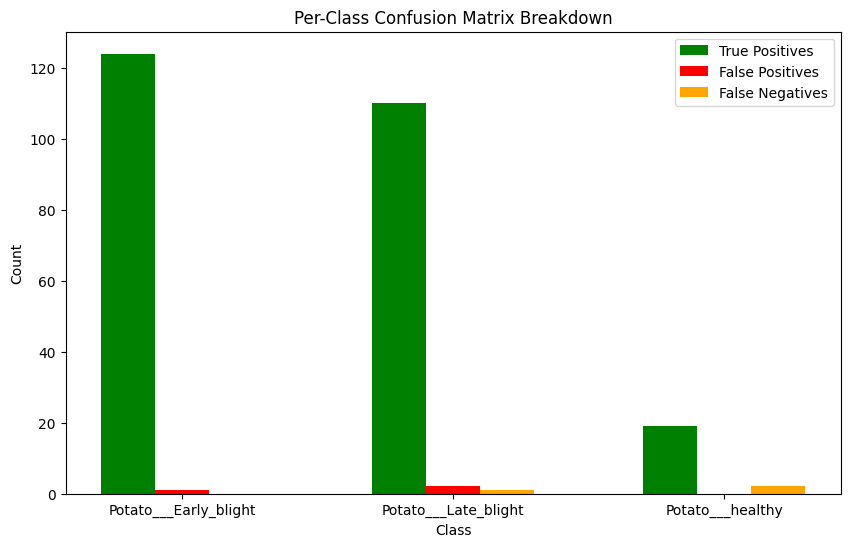

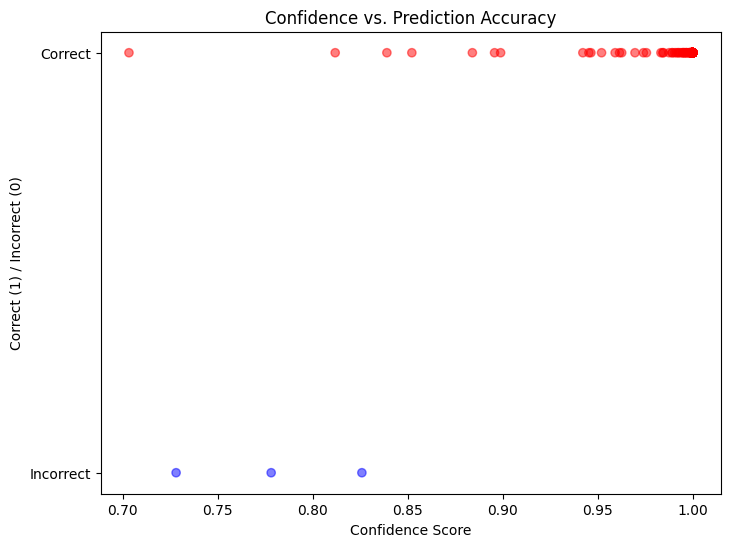

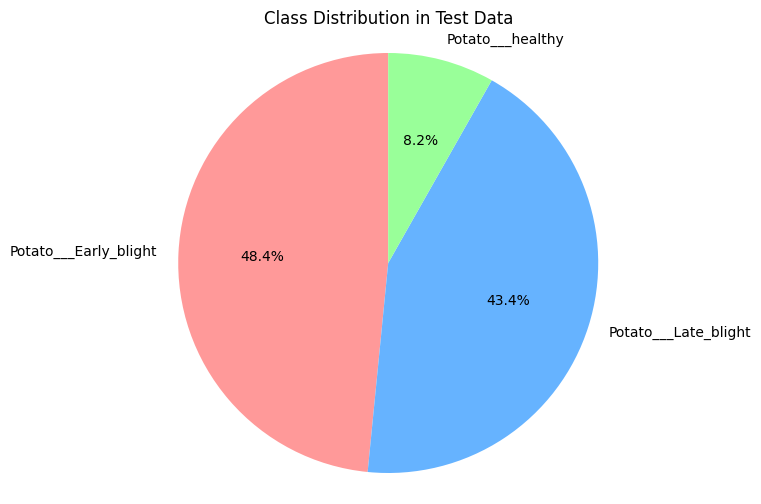

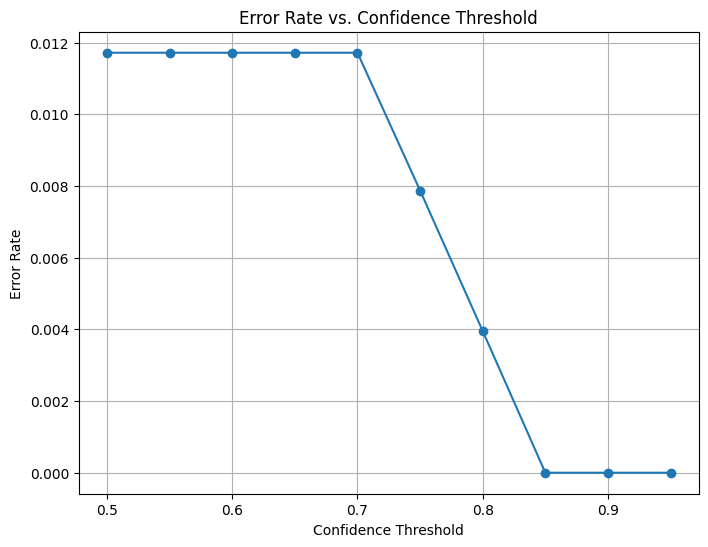

In [65]:
# New Visualization 1: Per-Class Confusion Matrix Bar Plot
plt.figure(figsize=(10, 6))
bar_width = 0.2
index = np.arange(len(class_names))
tp = np.diag(cm)  # True Positives
fp = cm.sum(axis=0) - tp  # False Positives
fn = cm.sum(axis=1) - tp  # False Negatives
plt.bar(index, tp, bar_width, label='True Positives', color='green')
plt.bar(index + bar_width, fp, bar_width, label='False Positives', color='red')
plt.bar(index + 2 * bar_width, fn, bar_width, label='False Negatives', color='orange')
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Per-Class Confusion Matrix Breakdown')
plt.xticks(index + bar_width, class_names)
plt.legend()
plt.show()

# New Visualization 2: Confidence vs. Accuracy Scatter
correct = (test_pred_labels == test_labels).astype(int)
plt.figure(figsize=(8, 6))
plt.scatter(confidence_scores, correct, alpha=0.5, c=correct, cmap='bwr', label='Prediction Outcome')
plt.xlabel('Confidence Score')
plt.ylabel('Correct (1) / Incorrect (0)')
plt.title('Confidence vs. Prediction Accuracy')
plt.yticks([0, 1], ['Incorrect', 'Correct'])
plt.show()

# New Visualization 3: Class Distribution Pie Chart
class_counts = np.bincount(test_labels, minlength=len(class_names))
plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_names, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff','#99ff99'])
plt.title('Class Distribution in Test Data')
plt.axis('equal')
plt.show()

# New Visualization 4: Error Rate by Confidence Threshold
thresholds = np.arange(0.5, 1.0, 0.05)
error_rates = []
for thresh in thresholds:
    high_conf_preds = test_pred_labels[confidence_scores >= thresh]
    high_conf_labels = test_labels[confidence_scores >= thresh]
    if len(high_conf_preds) > 0:
        error_rate = 1 - np.mean(high_conf_preds == high_conf_labels)
        error_rates.append(error_rate)
    else:
        error_rates.append(np.nan)
plt.figure(figsize=(8, 6))
plt.plot(thresholds, error_rates, marker='o')
plt.xlabel('Confidence Threshold')
plt.ylabel('Error Rate')
plt.title('Error Rate vs. Confidence Threshold')
plt.grid(True)
plt.show()

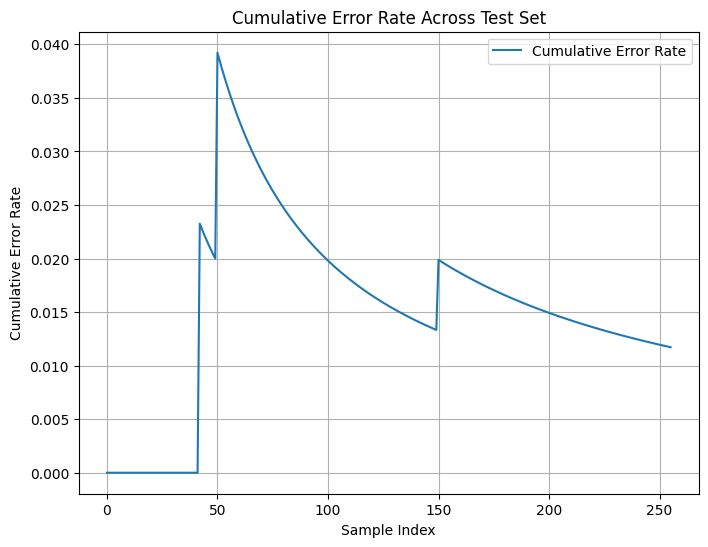

C:\Users\Admin\AppData\Local\Temp\ipykernel_13128\128990708.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(confidence_per_class, labels=class_names, patch_artist=True, boxprops=dict(facecolor='lightblue'))


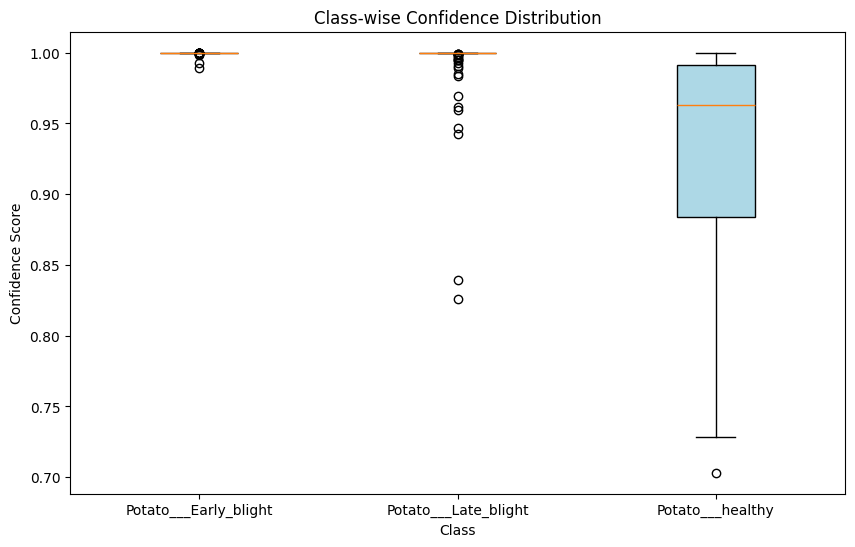

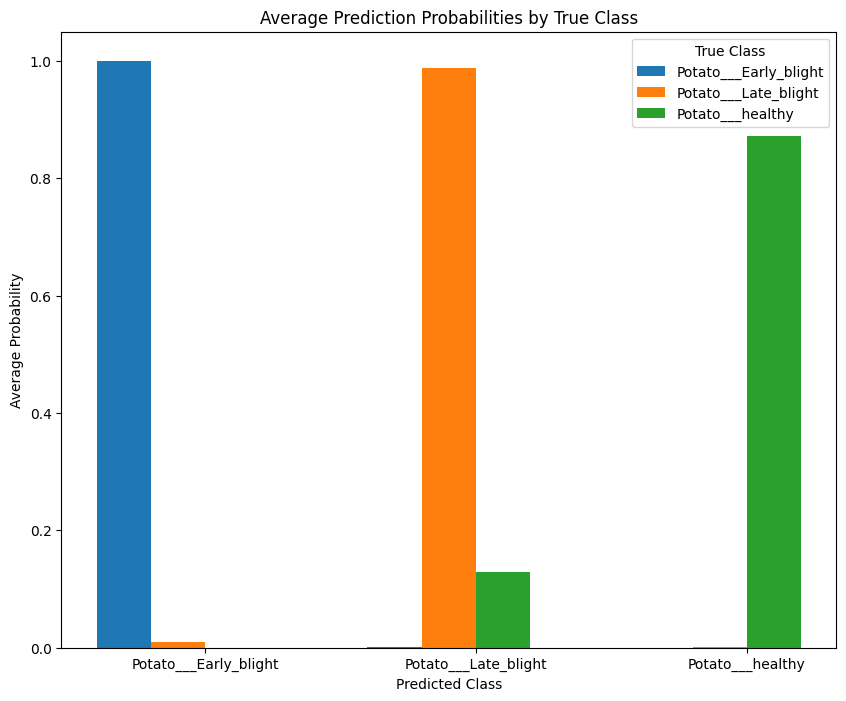

In [66]:
# New Visualization 1: Cumulative Error Plot
errors = (test_pred_labels != test_labels).astype(int)
cumulative_errors = np.cumsum(errors) / np.arange(1, len(errors) + 1)
plt.figure(figsize=(8, 6))
plt.plot(cumulative_errors, label='Cumulative Error Rate')
plt.xlabel('Sample Index')
plt.ylabel('Cumulative Error Rate')
plt.title('Cumulative Error Rate Across Test Set')
plt.grid(True)
plt.legend()
plt.show()

# New Visualization 2: Class-wise Confidence Box Plot
plt.figure(figsize=(10, 6))
confidence_per_class = [confidence_scores[test_labels == i] for i in range(len(class_names))]
plt.boxplot(confidence_per_class, labels=class_names, patch_artist=True, boxprops=dict(facecolor='lightblue'))
plt.xlabel('Class')
plt.ylabel('Confidence Score')
plt.title('Class-wise Confidence Distribution')
plt.show()

# New Visualization 3: Prediction Probability Bar Plot (for all test data)
avg_probs = np.zeros((len(class_names), len(class_names)))
for i in range(len(class_names)):
    avg_probs[i] = np.mean(test_preds[test_labels == i], axis=0)
plt.figure(figsize=(10, 8))
for i in range(len(class_names)):
    plt.bar(np.arange(len(class_names)) + i * 0.2, avg_probs[i], width=0.2, label=class_names[i])
plt.xticks(np.arange(len(class_names)) + 0.3, class_names)
plt.xlabel('Predicted Class')
plt.ylabel('Average Probability')
plt.title('Average Prediction Probabilities by True Class')
plt.legend(title='True Class')
plt.show()

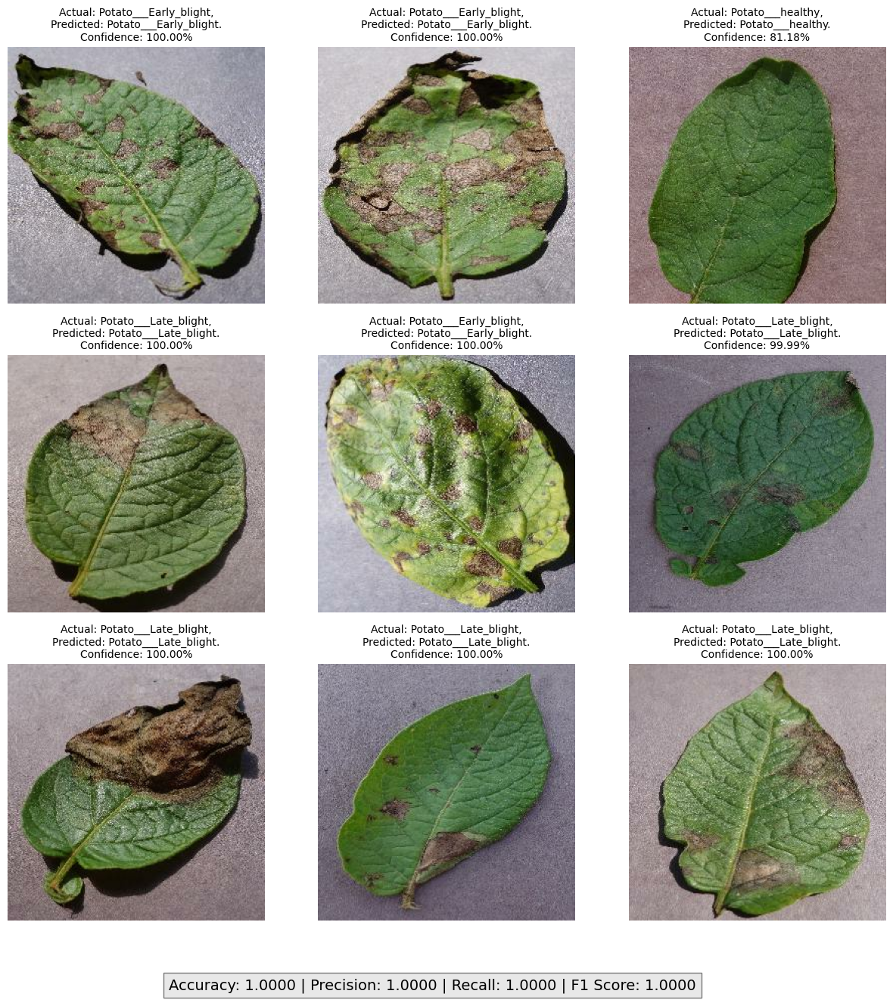

Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Classification Report:
                       precision    recall  f1-score   support

Potato___Early_blight       1.00      1.00      1.00         3
 Potato___Late_blight       1.00      1.00      1.00         5
     Potato___healthy       1.00      1.00      1.00         1

             accuracy                           1.00         9
            macro avg       1.00      1.00      1.00         9
         weighted avg       1.00      1.00      1.00         9



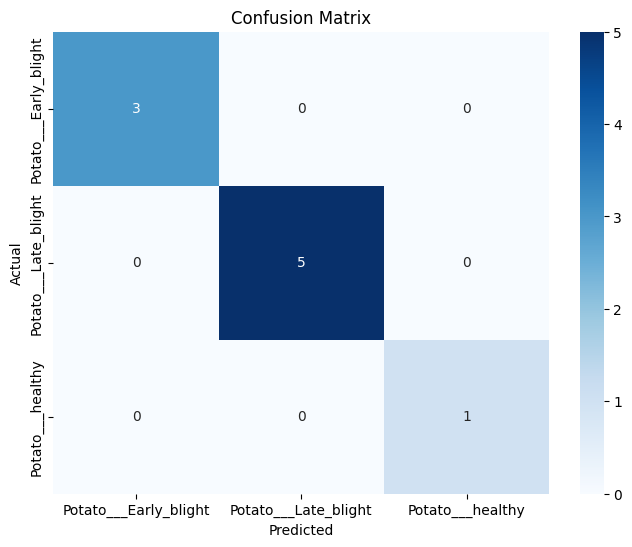

In [67]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, classification_report

plt.figure(figsize=(15, 15))

y_true = []
y_pred = []

for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\nPredicted: {predicted_class}.\nConfidence: {confidence:.2f}%", fontsize=10)
        plt.axis("off")

        # Store values for metric calculation
        y_true.append(class_names.index(actual_class))  # Convert actual class to index
        y_pred.append(class_names.index(predicted_class))  # Convert predicted class to index

# Convert lists to NumPy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Compute Metrics
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

# Display the metrics below the image grid
plt.figtext(0.5, 0.05, f"Accuracy: {accuracy:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f} | F1 Score: {f1:.4f}", 
            wrap=True, horizontalalignment='center', fontsize=14, bbox={"facecolor": "lightgray", "alpha": 0.5, "pad": 5})

plt.show()

# Print overall metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Print per-class metrics
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Generate confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()
